# Image / Video to text recipe

In [226]:
!pip install -Uqq fastai duckduckgo_search timm
import timm

## Step 1: Download images of products food

In [227]:
from duckduckgo_search import DDGS

def search_images(term, max_images=20):
    with DDGS() as ddgs:
        print(term)
        ddgs_images_gen = ddgs.images(
            keywords=term,
            max_results=max_images
        )
        return [result['image'] for result in ddgs_images_gen]


#### download a image of product example

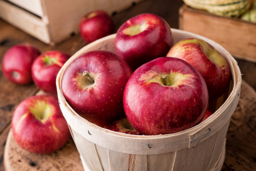

In [229]:
from fastdownload import download_url
dest = 'apple.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

#### download all images and save in folder each object 

In [230]:
from pathlib import Path
from time import sleep
import requests
import re

searches = ['apple', 'milk', 'lemon', 'broccoli', 'carrot', 'banana'   ]
path = Path('foodproduct')

def sanitize_filename(name):
    return re.sub(r'[<>:"/\\|?*]', '_', name)

def download_images(dest, urls):
    for url in urls:
        try:
            filename = sanitize_filename(url.split('/')[-1])  # Get a valid filename
            response = requests.get(url)
            if response.status_code == 200:
                with open(dest / filename, 'wb') as f:
                    f.write(response.content)
            else:
                print(f"Failed to download image from {url}")
        except Exception as e:
            print(f"Error downloading {url}: {e}")

def download(category):
    if category.lower() == "milk":
         variations = [
        'milk bottle photo', 'milk carton photo', 'milk bottle close-up',
        'milk carton close-up', 'milk bottle in fridge', 'milk carton in fridge',
        'milk pouring into glass', 'milk in glass on table', 'milk bottle on kitchen counter',
        'milk carton being opened', 'organic milk bottle', 'fresh milk close-up',
         ]
    else:
         variations = [
        f'{category} photo', f'{category} close-up', f'{category} in bowl',
        f'{category} cut', f'{category} whole', f'{category} supermarket',
        f'{category} on wooden board', f'{category} in natural light', f'{category} with ingredients',
        f'fresh {category} close-up', f'{category} dark', f'{category} in cooking pan',
        f'{category} COLOR ', f'{category} farm-fresh', f'{category} in a store setting' ,  f'{category} COLOR ',
    ]

    dest = path / category
    if dest.exists() and any(dest.iterdir()):
        print(f"Skipping download for '{category}' as folder already exists and contains files.")
        return

    dest.mkdir(exist_ok=True, parents=True)

    for variation in variations:
        download_images(dest, urls=search_images(variation))
        sleep(2)

# Run the download function for each product in searches
for product in searches:
    download(product)

Skipping download for 'apple' as folder already exists and contains files.
Skipping download for 'milk' as folder already exists and contains files.
Skipping download for 'lemon' as folder already exists and contains files.
Skipping download for 'broccoli' as folder already exists and contains files.
Skipping download for 'carrot' as folder already exists and contains files.
Skipping download for 'banana' as folder already exists and contains files.


## Step 2: Train our model

##### Remove failed images

In [231]:
failed = verify_images(get_image_files(path))
for failed_img in failed:
    Path(failed_img).unlink()

len(failed)

0

To train a model, we'll need `DataLoaders`, which is an object that contains a *training set* (the images used to create a model) and a *validation set* (the images used to check the accuracy of a model -- not used during training). In `fastai` we can create that easily using a `DataBlock`, and view sample images from it:

In [234]:
from fastai.vision.all import *

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()

        # First convolutional layer: 3 input channels (RGB), 16 output channels, 3x3 kernel size
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second convolutional layer: 16 input channels, 32 output channels, 3x3 kernel size
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Third convolutional layer: 32 input channels, 64 output channels, 3x3 kernel size
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.ReLU()
        self.maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Fully connected layers for classification
        self.fc1 = nn.Linear(64 * 24 * 24, 256)  # Adjust based on your input image size
        self.fc2 = nn.Linear(256, len(dls.vocab))  # Output size = number of classes

    def forward(self, x):
        # Pass the input through each layer
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.maxpool1(x)

        x = self.conv2(x)
        x = self.relu2(x)
        x = self.maxpool2(x)

        x = self.conv3(x)
        x = self.relu3(x)
        x = self.maxpool3(x)

        # Flatten the output for the fully connected layers
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc1(x)
        x = self.fc2(x)
        return x

# Create a DataLoaders object as before
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

# Instantiate the custom CNN model
custom_cnn = CustomCNN()


# Run the model for learning

In [248]:
from fastai.vision.all import *
import os

# Define the model filename with the '.pkl' extension for export
model_filename = 'models/fruit_cnn_model.pkl'  # Use .pkl extension

# Ensure the models directory exists
os.makedirs('models', exist_ok=True)

# Check if the exported model file already exists
if os.path.exists(model_filename):
    print(f"Model '{model_filename}' already exists. Loading the model.")
    # Load the existing exported model
    learn = load_learner(model_filename)
else:
    print(f"Model '{model_filename}' does not exist. Training a new model.")

    # Initialize the learner (ensure dls and custom_cnn are defined)
    learn = Learner(dls, custom_cnn, metrics=error_rate)
    number_of_epochs = 5
    learn.fine_tune(number_of_epochs)

    # Export the trained model
    learn.export(model_filename)
    print(f"Model trained and exported as '{model_filename}'.")


Model 'models/fruit_cnn_model.pkl' does not exist. Training a new model.


epoch,train_loss,valid_loss,error_rate,time
0,0.486933,1.304630,0.454545,01:10


epoch,train_loss,valid_loss,error_rate,time
0,0.332013,1.368180,0.384615,01:07
1,0.336466,1.533762,0.524476,01:07
2,0.253524,1.372402,0.461538,01:07
3,0.179895,1.298779,0.377622,01:08
4,0.126548,1.319888,0.412587,01:07


Model trained and exported as 'models/fruit_cnn_model.pkl'.


## Step 3: Use our model 

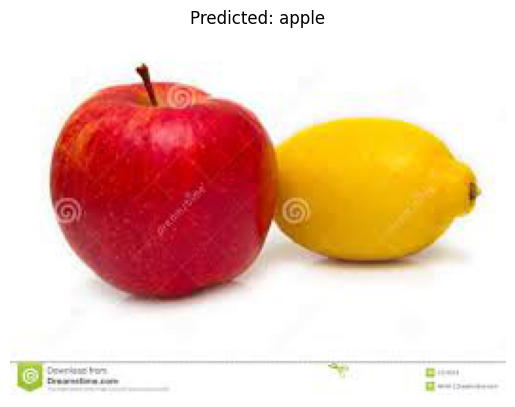

In [249]:
from fastai.vision.all import *  # Import Fastai vision library for image processing
from PIL import Image  # Import PIL for image handling

# Load the image
img_path = 'applelemon.jpeg'  # Ensure this path is correct
img = PILImage.create(img_path)

# Make a prediction
productimages, _, probs = learn.predict(img)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title(f'Predicted: {productimages}')  # Show prediction and probabilities
plt.show()

In [250]:
# Function to display all products above a probability threshold
def list_all_products(probs, threshold=0.7):
    # Create a list of products with their probabilities above the threshold
    products_above_threshold = [(learn.dls.vocab[i], probs[i].item()) for i in range(len(probs)) if probs[i] > threshold]
    return products_above_threshold

# Call the function to get all products with their probabilities above the threshold
products_list = list_all_products(probs)

# Find the product with the highest probability
if products_list:
    dominated_product, max_prob = max(products_list, key=lambda x: x[1])
else:
    dominated_product, max_prob = None, None

# Collect unique product names for final output
collected_products = set(product for product, prob in products_list)

# Analyze the number of unique products identified in the image
unique_product_count = len(collected_products)

# Print the dominated product (the one with the highest probability)
if dominated_product:
    print(f"The dominated product is: {dominated_product} with a probability of {max_prob:.6f}")
else:
    print("No products were identified above the threshold.")

# Print all identified products with their probabilities
print("Identified products with probabilities:")
for product, prob in products_list:
    print(f"{product}: {prob:.6f}")

# Print the unique products without duplicates and their count
print(f"\nTotal unique products identified: {unique_product_count}")
print("Collected products (without duplicates):")
print(", ".join(collected_products))


The dominated product is: apple with a probability of 0.997523
Identified products with probabilities:
apple: 0.997523

Total unique products identified: 1
Collected products (without duplicates):
apple


### Use groq llm model - for making the recipe 

In [251]:
!pip install langchain langchain-openai langchain-groq

In [252]:
from langchain_core.prompts import PromptTemplate, ChatPromptTemplate, HumanMessagePromptTemplate, SystemMessagePromptTemplate
from langchain_openai import ChatOpenAI
from langchain_groq import ChatGroq
from fastai.vision.all import PILImage

GROQ_API_KEY="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"  #


In [253]:
def show_probs(learn, probs):
    return pd.Series(probs, index=learn.dls.vocab)

# show_probs(learn, probs)

In [289]:
from langchain_core.prompts import (
    ChatPromptTemplate,
    HumanMessagePromptTemplate,
    SystemMessagePromptTemplate
)
from langchain_groq import ChatGroq
from pydantic import BaseModel, Field ,conlist
from typing import List, Dict, Any, Optional


# Define data models for the recipe
class Ingredient(BaseModel):
    name: str
    amount: str
    unit: str

class Recipe(BaseModel):
    title: str
    servings: int = Field(..., description="Number of servings")  # Now required
    prep_time: str = Field(..., description="Preparation time")  # Now required
    cook_time: str = Field(..., description="Cooking time")  # Now required
    total_time: str = Field(..., description="Total time")  # Now required
    difficulty: str = Field(..., description="Difficulty level")  # Now required
    cuisine: str = Field(..., description="Cuisine type")  # Now required
    category: str = Field(..., description="Category of the dish")  # Now required
    ingredients: List[Ingredient]
    equipment: List[str]
    instructions: List[str]
    tips: List[str]
    nutrition: Dict[str, Any] = Field(..., description="Nutritional information")  # Now required
    detected_products: List[Ingredient] = Field(default_factory=list, description="List of detected products")
    removed_products: List[Ingredient] = Field(default_factory=list, description="List of ingredients that were not included in the final recipe, indicating all ingredients present in the input list that were not retained.")
    added_products: List[Ingredient] = Field(default_factory=list, description="List of ingredients that were added to the recipe, which were not part of the original input list but are necessary for the recipe.")




# Initialize the language model
llm = ChatGroq(model="llama3-groq-70b-8192-tool-use-preview", api_key=GROQ_API_KEY)

# Create a prompt for the language model
prompt = ChatPromptTemplate(
    [
        SystemMessagePromptTemplate.from_template(
            "The assistant is a chef and recipe expert. "
            "The task is to generate a recipe using the given ingredients. "
            "You must add any necessary ingredients, indicate which provided ingredients are not suitable, remove ingredients and added more 2 minumum must "
            "and suggest alternative ingredients if necessary. must adding or remove "
        ),
        HumanMessagePromptTemplate.from_template("""\
        The ingredients provided are:

        {ingredients_list}

        Please generate a recipe in the specified format, ensuring to add and remove any missing ingredients required for the recipe.
        """)
    ]
)

# Function to generate the recipe and track added/removed products
def generate_recipe(ingredients_list: List[str]):
    ingredients_str = ", ".join(ingredients_list)  # Convert list to a string for the prompt
    recipe_chain = prompt | llm.with_structured_output(schema=Recipe)

    # Invoke the model and print the output
    try:
        result = recipe_chain.invoke({"ingredients_list": ingredients_str})

        # Extract suggested ingredient names from the result
        suggested_ingredients = [ing.name for ing in result.ingredients]  # Suggested ingredients

        # Determine added and removed products
        added_products = [prod for prod in suggested_ingredients if prod not in ingredients_list]
        removed_products = [prod for prod in ingredients_list if prod not in suggested_ingredients]

        # Print the generated recipe
        print(result)  # Directly print the result as it's already in the desired format

        # Print added and removed products
        if added_products:
            print(f"\nAdded products: {', '.join(added_products)}")
        else:
            print("\nNo products were added to the recipe.")

        if removed_products:
            print(f"Removed products: {', '.join(removed_products)}")
        else:
            print("No products were removed from the recipe.")

    except Exception as e:
        print(f"Error generating recipe: {str(e)}")

# Example of using the function with a list of ingredients (at least 10 products)
ingredients = collected_products # exmaple etc ["lemon", "apple", "banana", "sugar", "flour", "milk", "eggs", "butter", "vanilla extract", "baking powder"]  # Example ingredients list
generate_recipe(ingredients)


title='Apple Pie' servings=8 prep_time='30 minutes' cook_time='45 minutes' total_time='1 hour 15 minutes' difficulty='Moderate' cuisine='American' category='Dessert' ingredients=[Ingredient(name='apple', amount='2', unit='cups'), Ingredient(name='all-purpose flour', amount='2', unit='cups'), Ingredient(name='sugar', amount='1', unit='cup'), Ingredient(name='butter', amount='1/2', unit='cup'), Ingredient(name='cinnamon', amount='1/2', unit='teaspoon'), Ingredient(name='nutmeg', amount='1/4', unit='teaspoon'), Ingredient(name='salt', amount='1/4', unit='teaspoon'), Ingredient(name='eggs', amount='1', unit='large'), Ingredient(name='milk', amount='1/2', unit='cup'), Ingredient(name='vanilla extract', amount='1', unit='teaspoon')] equipment=['baking dish', 'mixing bowl', 'whisk', 'measuring cups', 'measuring spoons', 'oven'] instructions=['Preheat oven to 375°F.', 'In a large bowl, mix together flour, sugar, and salt.', 'Add cold butter and mix until crumbly.', 'Press half of the mixture i


=== Generated Recipe ===
Apple Crumble photos


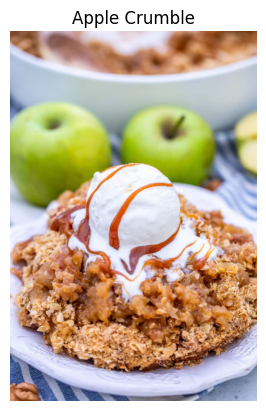

Title: Apple Crumble
### Detected products: apple
### Added products: sugar, flour, butter, oats, cinnamon
### No products were removed from the recipe.


Servings: 4
Preparation Time: 15 minutes
Cooking Time: 45 minutes
Total Time: 60 minutes
Difficulty: easy
Cuisine: British
Category: dessert

=== Ingredients ===
6 pieces of apple
1/2 cup cup of sugar
1/2 cup cup of flour
1/2 cup cup of butter
1/2 cup cup of oats
1 tsp tsp of cinnamon

=== Equipment Needed ===
- baking dish
- mixing bowl
- spoon

=== Instructions ===
1. Preheat oven to 375 degrees F.
2. In a large bowl, mix together the sliced apples, granulated sugar, and cinnamon.
3. In a separate bowl, mix together the flour, oats, and brown sugar.
4. Add the cold butter to the dry mixture and mix until crumbly.
5. Place the apple mixture in a baking dish and top with the crumb mixture.
6. Bake for 45 minutes or until the topping is golden brown.

=== Tips ===
- Use a variety of apple that holds its shape during baking, such as Gr

In [295]:
import matplotlib.pyplot as plt
from PIL import Image
from typing import List

# Function to search for images and display the first one
def show_product_image(product_name: str):
    # Search for images based on the product name
    urls = search_images(f"{product_name} photos", max_images=1)
    
    if urls:
        # URL of the first image
        image_url = urls[0]
        dest = f"{product_name}.jpg"
        
        # Download the image
        download_url(image_url, dest, show_progress=False)
        
        # Open and display the downloaded image
        im = Image.open(dest)
        plt.imshow(im)
        plt.axis('off')  # Hide axes
        plt.title(product_name)  # Optional title for the image
        plt.show()

# Function to generate a recipe and display details
def generate_recipe(ingredients_list: List[str]):
    ingredients_str = ", ".join(ingredients_list)  # Convert list to a string for the prompt
    recipe_chain = prompt | llm.with_structured_output(schema=Recipe)

    # Invoke the model and print the output
    try:
        result = recipe_chain.invoke({"ingredients_list": ingredients_str})

        # Extract suggested ingredient names from the result
        suggested_ingredients = [ing.name for ing in result.ingredients]  # Suggested ingredients

        # Determine added and removed products
        added_products = [prod for prod in suggested_ingredients if prod not in ingredients_list]
        removed_products = [prod for prod in ingredients_list if prod not in suggested_ingredients]

        # Print the generated recipe
        print("\n=== Generated Recipe ===")
        # Show product image if available
        show_product_image(result.title)
        print(f"Title: {result.title}")
        print(f"### Detected products: {(ingredients_str)}")
        # Print added and removed products
        if added_products:
            print(f"### Added products: {', '.join(added_products)}")
        else:
            print("No products were added to the recipe.")

        if removed_products:
            print(f"### Removed products: {', '.join(removed_products)}")
        else:
            print("### No products were removed from the recipe.")
        print(f"\n\nServings: {result.servings}")
        print(f"Preparation Time: {result.prep_time}")
        print(f"Cooking Time: {result.cook_time}")
        print(f"Total Time: {result.total_time}")
        print(f"Difficulty: {result.difficulty}")
        print(f"Cuisine: {result.cuisine}")
        print(f"Category: {result.category}")

        print("\n=== Ingredients ===")
        for ingredient in result.ingredients:
            print(f"{ingredient.amount} {ingredient.unit} of {ingredient.name}")

        print("\n=== Equipment Needed ===")
        for item in result.equipment:
            print(f"- {item}")

        print("\n=== Instructions ===")
        for index, instruction in enumerate(result.instructions, start=1):
            print(f"{index}. {instruction}")

        print("\n=== Tips ===")
        for tip in result.tips:
            print(f"- {tip}")

        print("\n=== Nutrition Information ===")
        for key, value in result.nutrition.items():
            print(f"{key}: {value}")


    except Exception as e:
        print(f"Error generating recipe: {str(e)}")

# Example of using the function with a list of ingredients (provide your collected products)
ingredients = collected_products  # Example ingredients list
generate_recipe(ingredients)


In [256]:
!pip install decord




=== Generated Recipe ===
Apple, Carrot, and Broccoli Salad photos


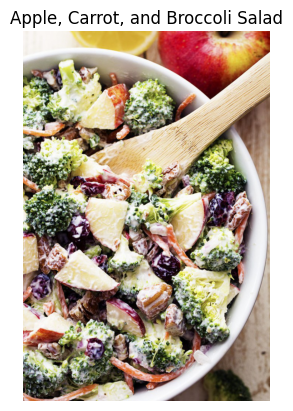

Title: Apple, Carrot, and Broccoli Salad
### Detected products: apple, carrot, broccoli
### Added products: olive oil, apple cider vinegar, Dijon mustard, honey, salt, black pepper
### No products were removed from the recipe.


Servings: 4
Preparation Time: 15 minutes
Cooking Time: 0 minutes
Total Time: 15 minutes
Difficulty: easy
Cuisine: American
Category: Salad

=== Ingredients ===
1 cup of apple
1 cup of carrot
1 cup of broccoli
2 tablespoons of olive oil
1 tablespoon of apple cider vinegar
1 teaspoon of Dijon mustard
1 teaspoon of honey
to taste pinch of salt
to taste pinch of black pepper

=== Equipment Needed ===
- knife
- cutting board
- bowl

=== Instructions ===
1. Wash and peel the apple, carrot, and broccoli.
2. Chop the apple, carrot, and broccoli into small pieces.
3. In a bowl, whisk together olive oil, apple cider vinegar, Dijon mustard, and honey.
4. Add the chopped apple, carrot, and broccoli to the bowl and toss to combine.
5. Season with salt and black pepper to ta

In [296]:
from decord import VideoReader, cpu
from fastai.vision.all import PILImage
import requests
from io import BytesIO
from PIL import Image as PILImageShow

def predict_video(video_path):
    vr = VideoReader(video_path, ctx=cpu(0))
    fps = vr.get_avg_fps()  # Get the frame rate of the video
    frames = [vr[i].asnumpy() for i in range(len(vr))]
    frame_predictions = defaultdict(set)
    skip_products = set()  # Temporarily store high-confidence products to skip in the next frames

    for frame_idx, frame in enumerate(frames):
        img = PILImage.create(frame)
        product, _, probs = learn.predict(img)
        
        # Check if the detected product has 100% confidence
        if probs.max() == 1.0:
            high_conf_product = product  # Store the high-confidence product to skip
            skip_products.add(high_conf_product)
            current_second = frame_idx // fps
            frame_predictions[high_conf_product].add(current_second)
            continue  # Skip adding other products for this frame

        # Detect products with probability > 0.01 excluding those in skip_products
        new_preds = {product for i, prob in enumerate(probs) if prob > 0.01 and product not in skip_products}

        for prod in new_preds:
            current_second = frame_idx // fps  # Calculate the current second
            frame_predictions[prod].add(current_second)

        # Clear skip_products after a set amount of frames (e.g., 1 second worth of frames)
        if frame_idx % fps == 0:
            skip_products.clear()

    return frame_predictions

    def format_time_list(time_set):
        time_ranges = sorted(time_set)  # Sort unique seconds
        ranges = []
        start_time = time_ranges[0]

        for i in range(1, len(time_ranges)):
            if time_ranges[i] != time_ranges[i - 1] + 1:  # Check for time gaps
                end_time = time_ranges[i - 1]
                ranges.append((start_time, end_time))
                start_time = time_ranges[i]

        ranges.append((start_time, time_ranges[-1]))  # Final range

        return ', '.join(f"{s}-{e} seconds" if s != e else f"{s} seconds" for s, e in ranges)

    # Print detected products with unique seconds
    for product, time_set in frame_predictions.items():
        formatted_times = format_time_list(time_set)
        print(f"{product} - seconds: {formatted_times}")

    return frame_predictions


# Run the prediction
videoname = 'fridgefood.mp4'
video_predictions = predict_video(videoname)
print("\n")

# Generate a recipe based on detected products
generate_recipe(video_predictions)


In [258]:
!pip install opencv-python

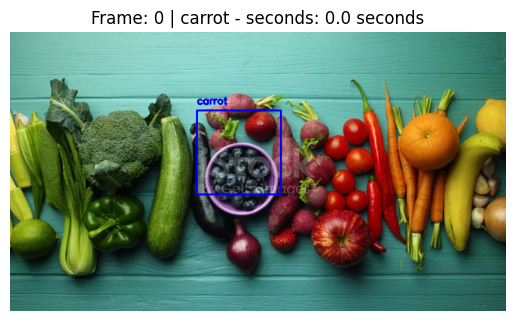

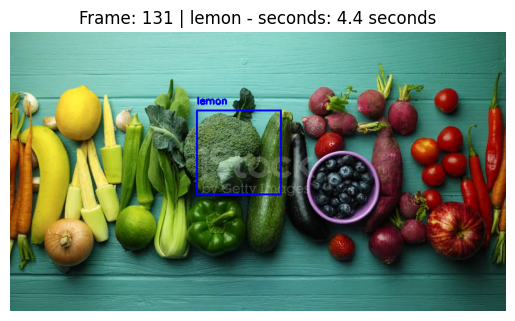

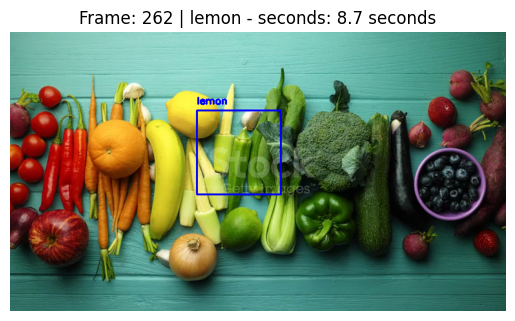

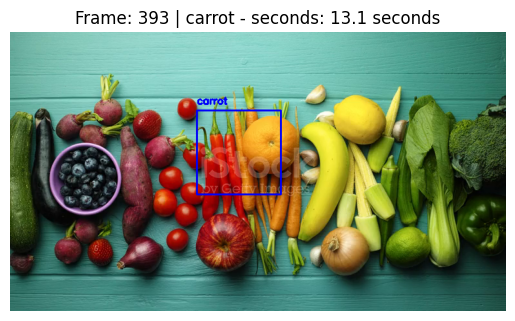

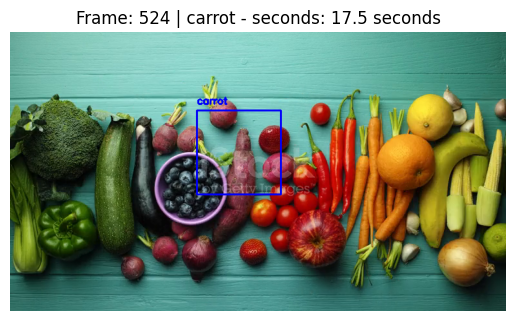


Final Detections:
Last prediction: carrot at seconds: 17.5


In [259]:
import os
import numpy as np
import matplotlib.pyplot as plt
from decord import VideoReader
import cv2  # OpenCV for image processing
from fastai.vision.all import PILImage  # For Fastai

def classify_frame(frame):
    """Classifies the given frame using the Fastai model."""
    img = PILImage.create(frame)  # Create a Fastai image from the frame
    productimages, _, probs = learn.predict(img)  # Make a prediction
    return productimages, probs  # Return the predicted class and probabilities

def draw_bounding_box(frame, label, center, size=(130, 130), color=(0, 0, 250), thickness=2):
    """Draw a bounding box around the detected object in the frame."""
    height, width, _ = frame.shape
    # Calculate top-left and bottom-right coordinates of the bounding box
    top_left = (max(0, center[0] - size[0] // 2), max(0, center[1] - size[1] // 2))
    bottom_right = (min(width, center[0] + size[0] // 2), min(height, center[1] + size[1] // 2))

    # Draw the bounding box and label on the frame
    cv2.rectangle(frame, top_left, bottom_right, color, thickness)
    cv2.putText(frame, label, (top_left[0], top_left[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, thickness)

def show_video_frames(video_path, num_frames=5):
    """Display video frames, checking for duplicates and classifying each frame."""
    if not os.path.exists(video_path):
        print("Video file does not exist.")
        return

    vr = VideoReader(video_path)
    total_frames = len(vr)
    fps = vr.get_avg_fps()  # Get the frames per second

    # Determine the frame indices to show
    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)
    last_frame = None  # To store the last displayed frame

    for idx in frame_indices:
        img = vr[idx].asnumpy()  # Convert to numpy array

        # Classify the current frame
        class_label, probs = classify_frame(img)

        # Calculate the current second
        current_second = idx / fps

        # Only store detection if probability exceeds a threshold
        if probs.max() > 0.01:  # Only store if the prediction is significant
            # Prepare title with the current product and its corresponding time
            title = f"Frame: {idx} | {class_label} - seconds: {current_second:.1f} seconds"
            # Define a center for the bounding box, shifting it slightly left and up
            center = (img.shape[1] // 2 - 30, img.shape[0] // 2 - 30)  # Shift left and up by 20 pixels
            draw_bounding_box(img, class_label, center)  # Draw the box on the image
        else:
            title = f"Frame: {idx} | No significant prediction"

        # Check for duplicates
        if last_frame is None or not np.array_equal(img, last_frame):
            plt.imshow(img)
            plt.axis('off')  # Hide axes
            plt.title(title)  # Show current prediction in the title
            plt.show()
            last_frame = img  # Update the last displayed frame
        else:
            print(f'Skipping duplicate frame {idx + 1}')

    # Print the last prediction for reference
    print("\nFinal Detections:")
    print(f'Last prediction: {class_label} at seconds: {current_second:.1f}')

# Example usage
videoname = 'products.mp4'  # Ensure the correct video path is used
show_video_frames(videoname)


In [297]:
import cv2
import numpy as np
from fastai.vision.all import *

# Load your trained model
learn = load_learner('models/fruit_cnn_model.pkl')

def predict_from_frame(frame):
    """Predict the products in the given frame using the trained model."""
    img = PILImage.create(frame)
    # Get predictions for multiple classes
    products, _, probs = learn.predict(img)
    return products, probs

def extract_frames(video_path, interval=80):
    """Extract frames from the video at a specified interval."""
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % interval == 0:  # Extract every 'interval' frame
            frames.append(frame)
        frame_count += 1

    cap.release()
    return frames

def create_summary_video(original_video_path, output_video_path):
    """Create a summary video with detected ingredients displayed."""
    cap = cv2.VideoCapture(original_video_path)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    
    # Get the fps of the original video
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    detected_ingredients = []  # Initialize an empty list to track ingredients

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Predict the products in the current frame
        product, _ = predict_from_frame(frame)
        
        # Update detected ingredients (combine current detections with previous ones)
        detected_ingredients.append(str(product))  # Convert product to string and append
        
        # Remove duplicates by converting to a set and back to list
        detected_ingredients = list(set(detected_ingredients))
        
        # Generate the ingredient text to display
        ingredient_text = f"Detected Ingredients: {', '.join(detected_ingredients)}"
        
        # Add detected ingredients to the frame (displaying as text)
        cv2.putText(frame, ingredient_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        
        # Write the modified frame to the output video
        out.write(frame)

    cap.release()
    out.release()

def generate_recipe(ingredients):
    """Generate a recipe based on identified ingredients."""
    if ingredients:
        recipe = f"Recipe using: {', '.join(set(ingredients))}"  # Use set to avoid duplicates
    else:
        recipe = "No ingredients identified."
    return recipe

def main(video_path, output_video_path):
    """Main processing function to extract frames, identify ingredients, and create a summary video."""
    # Step 1: Create a summary video with highlighted ingredients
    create_summary_video(video_path, output_video_path)

# Run the main processing function
video_path = 'fridgefood.mp4'
output_video_path = 'fridgefood2.avi'  # Changed to .avi for XVID codec
main(video_path, output_video_path)

print("Recipe generation and video processing completed!")

KeyboardInterrupt: 

In [261]:
#YOLO

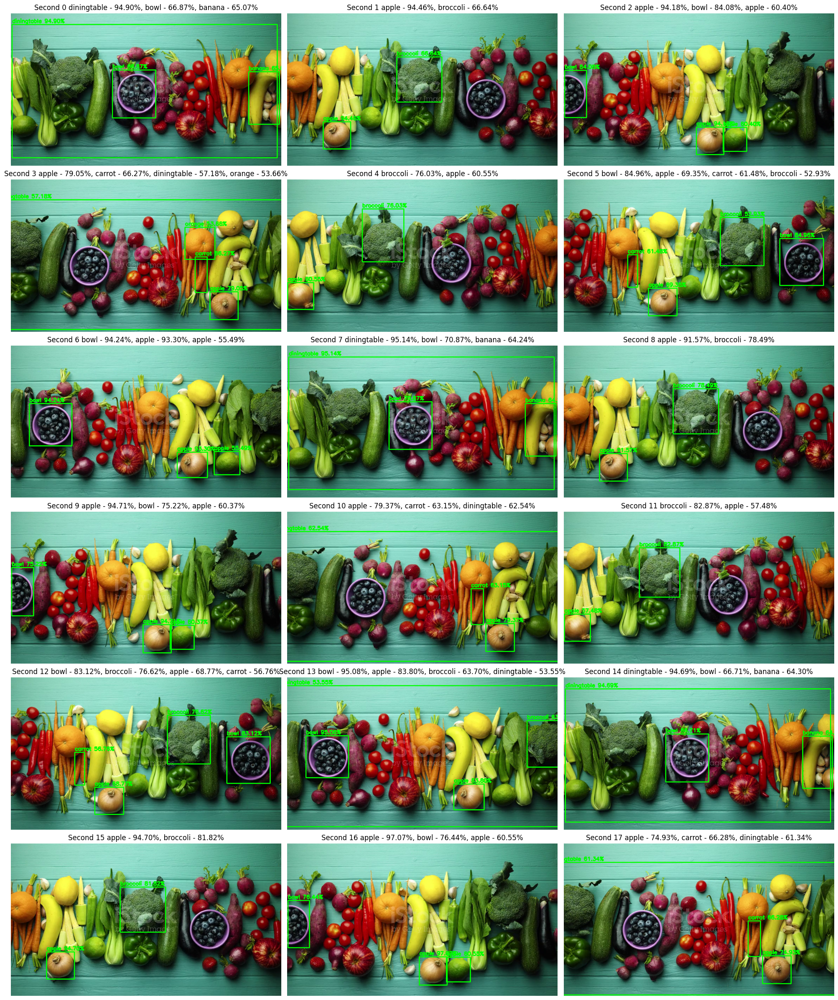

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Load YOLOv3 model
net = cv2.dnn.readNet("yolo3/yolov3.weights", "yolo3/yolov3.cfg")
with open("yolo3/coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Get output layer names
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

def zoom_in_on_product(image, x, y, w, h):
    """Zoom in on the detected product."""
    zoom_factor = 1.5
    center_x, center_y = x + w // 2, y + h // 2
    new_w = int(w * zoom_factor)
    new_h = int(h * zoom_factor)

    # Calculate the cropping rectangle
    x1 = max(center_x - new_w // 2, 0)
    y1 = max(center_y - new_h // 2, 0)
    x2 = min(center_x + new_w // 2, image.shape[1])
    y2 = min(center_y + new_h // 2, image.shape[0])

    # Crop and resize to a smaller size
    zoomed_in = image[y1:y2, x1:x2]
    zoomed_in_resized = cv2.resize(zoomed_in, (w // 2, h // 2))  # Resize to half the original bounding box size

    return zoomed_in_resized

def process_image(image):
    """Detect objects in a single image and return the image with detections."""
    height, width, _ = image.shape
    blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outputs = net.forward(output_layers)

    # Extract boxes, confidences, and class IDs
    boxes, confidences, class_ids = [], [], []
    zoomed_images = []  # List to store zoomed images
    for output in outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x, center_y = int(detection[0] * width), int(detection[1] * height)
                w, h = int(detection[2] * width), int(detection[3] * height)
                x, y = int(center_x - w / 2), int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

                # Zoom in on detected product and store the zoomed image
                zoomed_image = zoom_in_on_product(image, x, y, w, h)
                zoomed_images.append((zoomed_image, str(classes[class_id]), confidence))

    # Apply Non-Max Suppression
    indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    detections = []  # Store detections and their confidences
    unique_labels = set()  # To track unique detections
    for i in indices.flatten():
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        confidence = confidences[i]

        # Only add detection if it's unique
        unique_key = (label, round(confidence, 2))
        if unique_key not in unique_labels:
            unique_labels.add(unique_key)

            # Draw the bounding box on the original image
            color = (0, 255, 0)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)

            # Create the label with product name and confidence percentage
            label_with_confidence = f"{label} {confidence:.2%}"
            cv2.putText(image, label_with_confidence, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            # Store detection info
            detections.append((label, confidence))

    return image, detections, zoomed_images  # Return the processed image, detections, and zoomed images

def store_unique_zoomed_images(zoomed_images):
    """Store and return unique zoomed-in images based on label and confidence."""
    unique_images = {}
    for zoomed_image, label, confidence in zoomed_images:
        # Create a unique key for the image based on label and confidence
        unique_key = (label, round(confidence, 2))
        if unique_key not in unique_images:
            unique_images[unique_key] = zoomed_image

    return list(unique_images.values())  # Return only the unique images

def process_video(video_path):
    """Process a video file, applying object detection to each frame."""
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = fps  # Process every second
    processed_frames = []
    detections_per_second = []  # Store detections for each second
    all_zoomed_images = []  # Store all zoomed images

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            processed_frame, detections, zoomed_images = process_image(frame)
            processed_frames.append(processed_frame)  # Store the processed frame
            detections_per_second.append((frame_count // fps, detections))  # Store second and detections
            all_zoomed_images.extend(zoomed_images)  # Collect all zoomed images

        frame_count += 1

    cap.release()

    # Display all processed frames and detections in a grid layout with 3 frames per row
    num_frames = len(processed_frames)
    num_rows = (num_frames + 2) // 3  # Calculate number of rows needed for 3 frames per row
    fig, axs = plt.subplots(num_rows, 3, figsize=(20, 4 * num_rows))
    axs = axs.flatten()  # Flatten the 2D array of axes to easily iterate

    for idx, (second, detections) in enumerate(detections_per_second):
        if idx < len(axs):
            axs[idx].imshow(cv2.cvtColor(processed_frames[idx], cv2.COLOR_BGR2RGB))
            axs[idx].axis("off")
            axs[idx].set_title(f"Second {second} " + ", ".join([f"{label} - {confidence:.2%}" for label, confidence in detections]))

    # Hide any unused subplots
    for j in range(idx + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()

    return store_unique_zoomed_images(all_zoomed_images)  # Return unique zoomed images for later plotting

# Main logic to process the input file
file_path = "products.mp4"  # Replace with the actual path to your image or video file

# Process the file based on its type
if os.path.isfile(file_path):
    # Try to read it as an image first
    image = cv2.imread(file_path)
    if image is not None:
        processed_image, detections, zoomed_images = process_image(image)  # Process as an image
        all_zoomed_images = store_unique_zoomed_images(zoomed_images)  # Store unique zoomed images
    else:
        all_zoomed_images = process_video(file_path)  # Process as a video
else:
    print("File not found. Please check the path.")


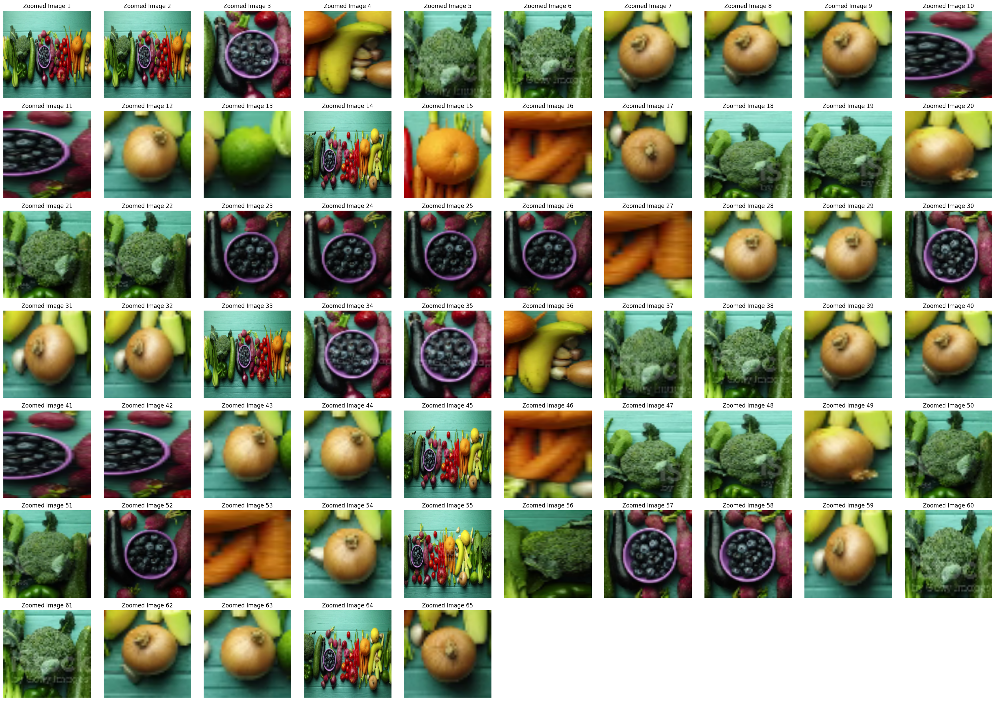

In [2]:
# Display all unique zoomed images at the end
images_per_row = 10
num_images = len(all_zoomed_images)
num_rows = (num_images // images_per_row) + (num_images % images_per_row > 0)

# Create subplots with a fixed size for each image
fig, axes = plt.subplots(num_rows, images_per_row, figsize=(images_per_row * 3, num_rows * 3))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through each image and display it
for idx in range(images_per_row * num_rows):
    if idx < num_images:
        # Resize the image to 30x30 pixels
        resized_image = cv2.resize(all_zoomed_images[idx], (200, 200))
        axes[idx].imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
        axes[idx].axis("off")
        axes[idx].set_title(f"Zoomed Image {idx + 1}")
    else:
        axes[idx].axis("off")  # Turn off the axis for empty subplots

plt.tight_layout()
plt.show()


In [10]:
import cv2
import numpy as np
import pandas as pd
import os

frame_skip = 10  # Process every 10th frame
frame_count = 0  # Counter for the frames
video_path = "products.mp4"  # Change this to your video path

# Create a directory for saving images if it doesn't exist
output_image_dir = 'yoloimages'
os.makedirs(output_image_dir, exist_ok=True)

# Load YOLO
net = cv2.dnn.readNet("yolo3/yolov3.weights", "yolo3/yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

# Load COCO classes
with open("yolo3/coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Initialize video capture
cap = cv2.VideoCapture(video_path)

# Initialize counters for detected products
counters = {}
detected_positions = {}

# Log for detected products
detection_log = []

# Function to check if two bounding boxes are close
def is_too_close(box1, box2, threshold=50):
    center1 = (box1[0] + box1[2] // 2, box1[1] + box1[3] // 2)
    center2 = (box2[0] + box2[2] // 2, box2[1] + box2[3] // 2)
    distance = np.linalg.norm(np.array(center1) - np.array(center2))
    return distance < threshold

# Function to check if two positions are close enough in x
def is_position_similar(pos1, pos2, threshold=30):
    return abs(pos1[0] - pos2[0]) < threshold

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_count += 1
    if frame_count % frame_skip != 0:
        continue
    
    height, width, _ = frame.shape
    
    # Prepare the frame for YOLO
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outputs = net.forward(output_layers)
    
    boxes = []
    confidences = []
    class_ids = []
    
    # Analyze the outputs
    for output in outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                
                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                # Append to lists
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    # Apply Non-Maxima Suppression
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    detected_labels = set()
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            detected_labels.add(label)

            if label not in detected_positions:
                detected_positions[label] = []  
            
            too_close = False
            for pos in detected_positions[label]:
                if is_too_close(boxes[i], pos) or is_position_similar((x, y), pos[:2]):
                    too_close = True
                    break
            
            if not too_close:
                counters[label] = counters.get(label, 0) + 1
                detected_positions[label].append(boxes[i])

                current_time = int(cap.get(cv2.CAP_PROP_POS_MSEC) // 1000)
                detection_log.append({
                    'Product': label,
                    'Start_Time': current_time,
                    'End_Time': current_time + frame_skip // 30,
                    'x': x,
                    'y': y,
                    'Image_URL': f"{output_image_dir}/{label}_{current_time}.jpg"  # Image URL placeholder
                })
                
                # Save the detected image
                detected_image = frame[y:y + h, x:x + w]
                cv2.imwrite(detection_log[-1]['Image_URL'], detected_image)  # Save image

                cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(frame, f"{label}: {counters[label]}", (x, y - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Overlay menu with counters for all detected products
    menu_y = 30
    cv2.putText(frame, "Detected Products:", (10, menu_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
    menu_y += 20
    for product, count in counters.items():
        cv2.putText(frame, f"{product}: {count}", (10, menu_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        menu_y += 20

    current_time = int(cap.get(cv2.CAP_PROP_POS_MSEC) // 1000)
    cv2.putText(frame, f"Second: {current_time}", (width - 100, height - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    cv2.imshow("Video", frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Create DataFrame from detection log
detection_df = pd.DataFrame(detection_log)

# Aggregate detection data for final output
final_output = {}
for _, row in detection_df.iterrows():
    product = row['Product']
    start_time = row['Start_Time']
    end_time = row['End_Time']
    location = (row['x'], row['y'])
    
    if product not in final_output:
        final_output[product] = {'Times': [], 'Count': 0, 'Locations': [], 'Image_URLs': []}  # Include Image_URLs

    # Check if there's an existing time range to merge
    if final_output[product]['Times']:
        last_start, last_end = final_output[product]['Times'][-1]
        if last_end + 1 >= start_time:
            final_output[product]['Times'][-1] = (last_start, max(last_end, end_time))
        else:
            final_output[product]['Times'].append((start_time, end_time))
    else:
        final_output[product]['Times'].append((start_time, end_time))

    final_output[product]['Count'] += 1
    final_output[product]['Locations'].append(location)
    final_output[product]['Image_URLs'].append(row['Image_URL'])  # Append Image URL

# Create a clear and organized DataFrame for final output
output_rows = []
for product, details in final_output.items():
    times = ', '.join([f"{start}-{end}" for start, end in details['Times']])
    count = details['Count']
    locations = ', '.join([f"({x},{y})" for x, y in details['Locations']])
    image_urls = ', '.join(details['Image_URLs'])  # Concatenate Image URLs
    output_rows.append({
        'Product': product,
        'Count': count,
        'Detected Times(seconds)': times,
        'Locations': locations,
        'Image_URLs': image_urls  # Add Image URLs to the output
    })

# Convert output rows into a DataFrame
final_df = pd.DataFrame(output_rows)

cap.release()
cv2.destroyAllWindows()

# Display the final DataFrame
(final_df)


,Product,Count,Detected Times(seconds),Locations,Image_URLs
0,diningtable,1,0-0,"(27,23)",yoloimages/diningtable_0.jpg
1,broccoli,5,0-1,"(216,103), (266,113), (388,112), (445,107), (4...","yoloimages/broccoli_0.jpg, yoloimages/broccoli..."
2,apple,6,0-2,"(1,291), (159,314), (239,308), (378,284), (296...","yoloimages/apple_0.jpg, yoloimages/apple_1.jpg..."
3,bowl,3,1-2,"(556,177), (615,168), (2,167)","yoloimages/bowl_1.jpg, yoloimages/bowl_1.jpg, ..."
4,carrot,1,1-1,"(180,213)",yoloimages/carrot_1.jpg


C:\Users\מיכאל\AppData\Local\Temp\ipykernel_3104\1803968417.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=final_df, x='Product', y='Count', palette=colors)


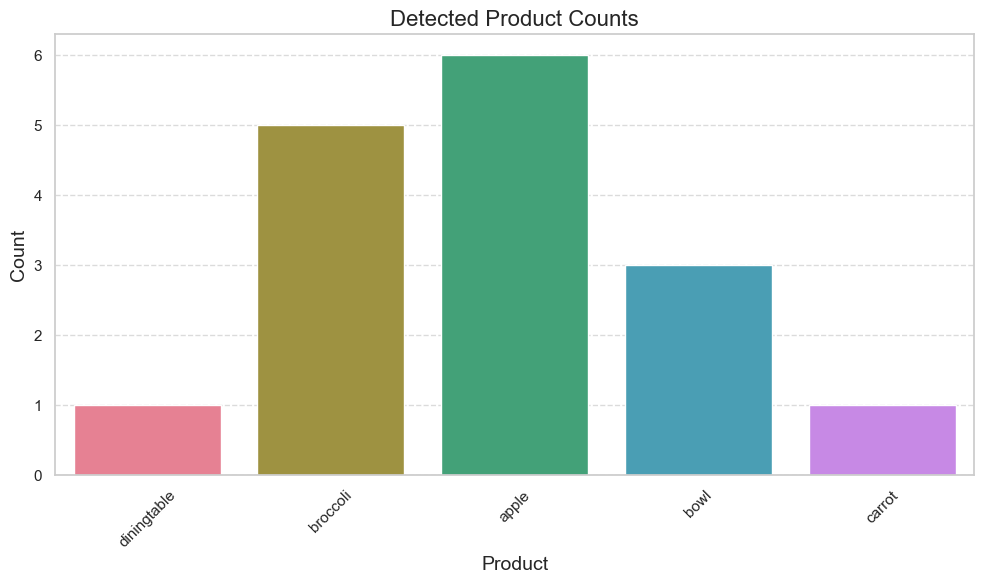

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set a style for the plots
sns.set(style="whitegrid")

# 1. Colored Bar Plot
def plot_colored_bar(final_df):
    plt.figure(figsize=(10, 6))
    colors = sns.color_palette("husl", len(final_df))  # Generate a color palette
    sns.barplot(data=final_df, x='Product', y='Count', palette=colors)
    plt.title('Detected Product Counts', fontsize=16)
    plt.xticks(rotation=45)
    plt.ylabel('Count', fontsize=14)
    plt.xlabel('Product', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


# Execute the plotting functions
plot_colored_bar(final_df)

